In [11]:
import random
from pathlib import Path
from PIL import Image
from transformers import pipeline
from IPython.display import display

pipe = pipeline(task="depth-estimation", model="depth-anything/Depth-Anything-V2-Small-hf")


Device set to use cuda:0


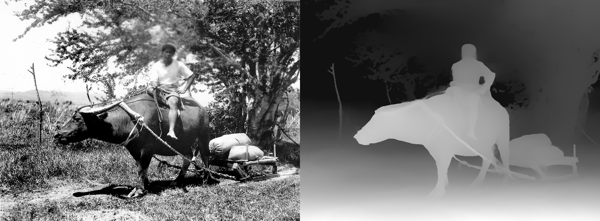

In [13]:
img_path = random.choice(list(Path('../../sample_data/coco_sample_datasets/sample_coco_train2017').glob('*.jpg')))
image = Image.open(img_path)
depth = pipe(image)["depth"]

# Concatenate the original image and the depth image side by side
concatenated = Image.new('RGB', (image.width + depth.width, image.height))
concatenated.paste(image, (0, 0))
concatenated.paste(depth.convert('RGB'), (image.width, 0))

# リサイズ
concatenated = concatenated.resize((600, int(600 * concatenated.height / concatenated.width)))

# Display the concatenated image
display(concatenated)

In [14]:
import numpy as np
import plotly.graph_objects as go

def plot_depth_as_point_cloud_interactive(depth_image, rgb_image):
    depth_array = np.array(depth_image)
    rgb_array = np.array(rgb_image)
    height, width = depth_array.shape

    # Create a grid of pixel coordinates
    x = np.arange(width)
    z = np.arange(height)  # Z now represents Y pixel
    x, z = np.meshgrid(x, z)

    # Flatten the arrays for plotting
    x_flat = x.flatten()
    z_flat = z.flatten()
    y_flat = depth_array.flatten()  # Y now represents depth

    # Reverse Y axis (depth)
    z_flat = -z_flat

    # Flatten RGB values and normalize to 0-1
    colors_flat = rgb_array.reshape(-1, 3) / 255.0

    # Create a 3D scatter plot using Plotly
    fig = go.Figure(data=[go.Scatter3d(
        x=x_flat,
        y=y_flat,
        z=z_flat,
        mode='markers',
        marker=dict(
            size=1,
            color=colors_flat,  # Use RGB colors
            opacity=0.8
        )
    )])

    fig.update_layout(
        scene=dict(
            xaxis_title='X Pixel',
            yaxis_title='Depth Value',
            zaxis_title='Y Pixel'
        ),
        margin=dict(l=0, r=0, b=0, t=0)
    )

    fig.show()

# Plot the depth image as an interactive point cloud
plot_depth_as_point_cloud_interactive(depth, image)

In [ ]:
# カメラを取得してリアルタイムで表示
import cv2
import time
import IPython
import numpy as np
from PIL import Image
from io import BytesIO
from transformers import pipeline
from PIL import Image
from IPython.display import display

pipe = pipeline(task="depth-estimation", model="depth-anything/Depth-Anything-V2-Small-hf")

device = 0
fmt = "jpeg"

cap = cv2.VideoCapture(device)
assert cap.isOpened(), 'Could not open video device'

try:
    prev_time = time.time()
    while True:
        ret, frame = cap.read()

        if ret:
            frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

            # Calculate FPS
            curr_time = time.time()
            fps = 1 / (curr_time - prev_time)
            prev_time = curr_time

            # Depth estimation
            depth = pipe(Image.fromarray(frame))["depth"]

            depth = np.array(depth)
            depth = (depth * 255).astype(np.uint8)  # Normalize to 0-255 for display
            depth = cv2.cvtColor(depth, cv2.COLOR_GRAY2RGB)  # Convert to RGB for concatenation

            # Draw FPS on the frame
            cv2.putText(frame, f"FPS: {fps:.2f}", (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 0, 0), 2)

            # Concatenate frame and depth
            concat = np.concatenate((frame, depth), axis=1)

            # Display the concatenated image
            f = BytesIO()
            Image.fromarray(concat).save(f, fmt)
            IPython.display.display(IPython.display.Image(data=f.getvalue()))
            IPython.display.clear_output(wait=True)

except KeyboardInterrupt:
    cap.release()
    print('Stream stopped')
